In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Edge Detection and Image Gradients

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


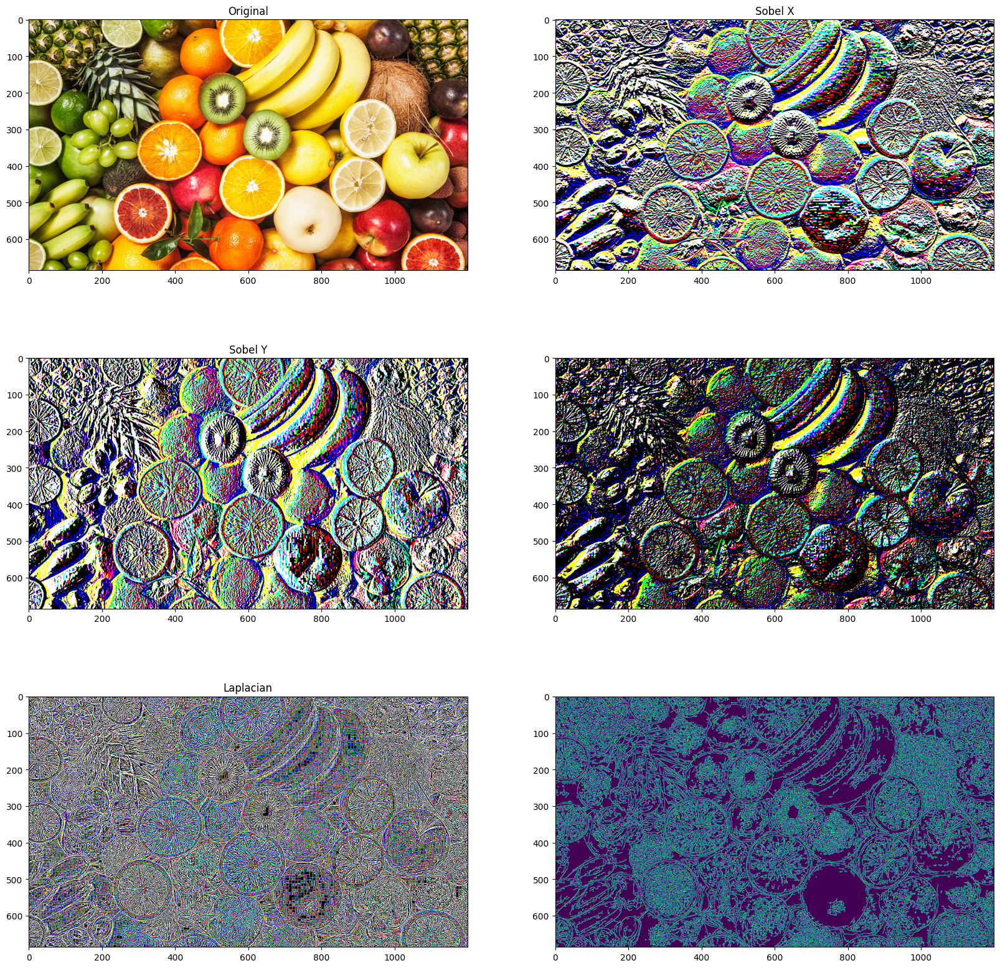

In [5]:
image = cv2.imread('fruit.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
hgt, wdt,_ = image.shape
# Sobel Edges
x_sobel = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
y_sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
plt.figure(figsize=(20, 20))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.subplot(3, 2, 2)
plt.title("Sobel X")
plt.imshow(x_sobel)
plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(y_sobel)
sobel_or = cv2.bitwise_or(x_sobel, y_sobel)
plt.subplot(3, 2, 4)
plt.imshow(sobel_or)
laplacian = cv2.Laplacian(image, cv2.CV_64F)
plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian)
## There are two values: threshold1 and threshold2.
## Those gradients that are greater than threshold2 => considered as an edge
## Those gradients that are below threshold1 => considered not to be an edge.
## Those gradients Values that are in between threshold1 and threshold2 => either classiﬁed as edges or non-edges
# The first threshold gradient
canny = cv2.Canny(image, 50, 120)
plt.subplot(3, 2, 6)
plt.imshow(canny)

# Dilation, Opening, Closing And Erosion

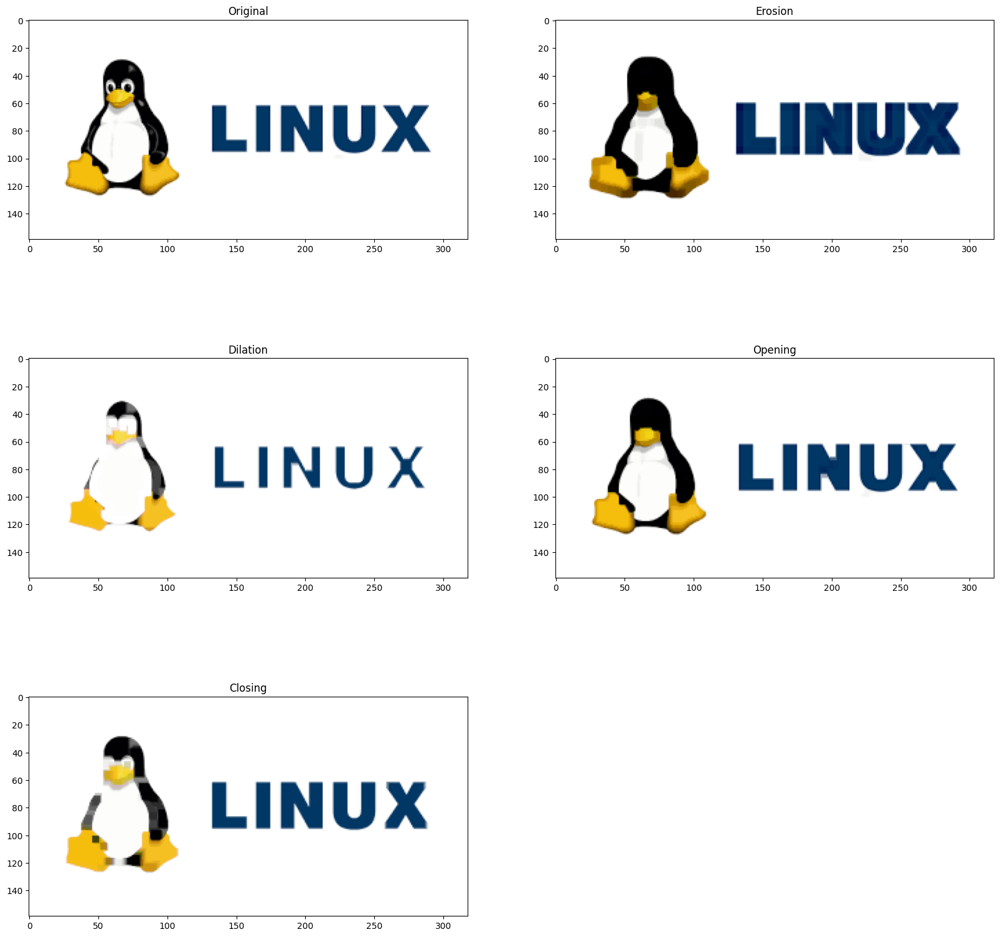

In [8]:
image = cv2.imread('LinuxLogo.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(image, kernel, iterations = 1)
plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion)
dilation = cv2.dilate(image, kernel, iterations = 1)
plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation)

opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening)

closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing)

# Perspective Transformation

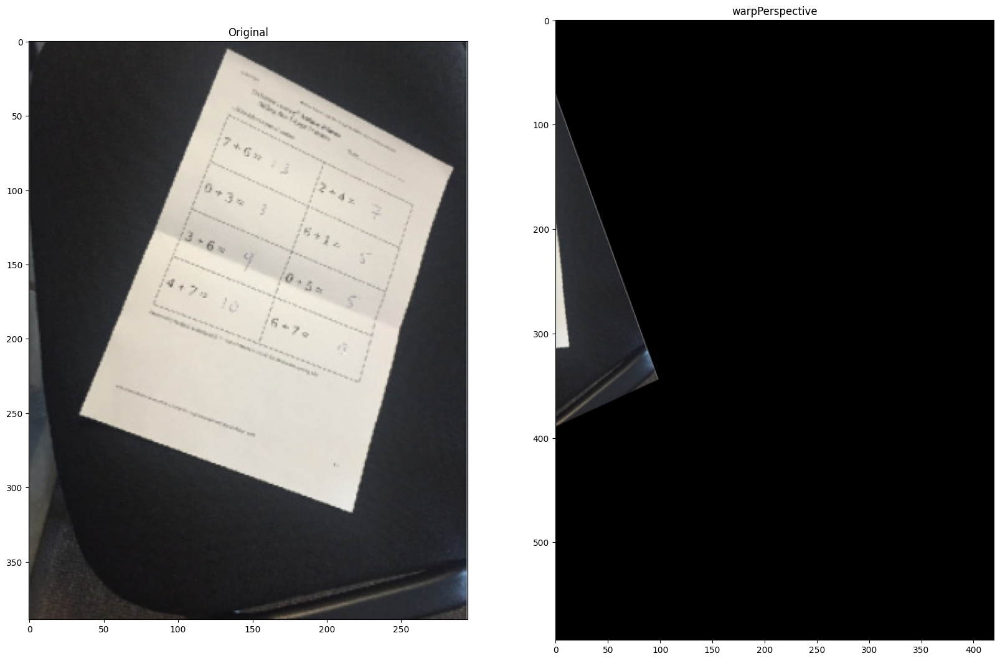

In [12]:
image = cv2.imread('scan.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)
points_A = np.float32([[320,15], [700,215], [85,610], [530,780]])
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])
M = cv2.getPerspectiveTransform(points_A, points_B)
warped = cv2.warpPerspective(image, M, (420,594))
plt.subplot(1, 2, 2)
plt.title("warpPerspective")
plt.imshow(warped)

# Image Pyramids

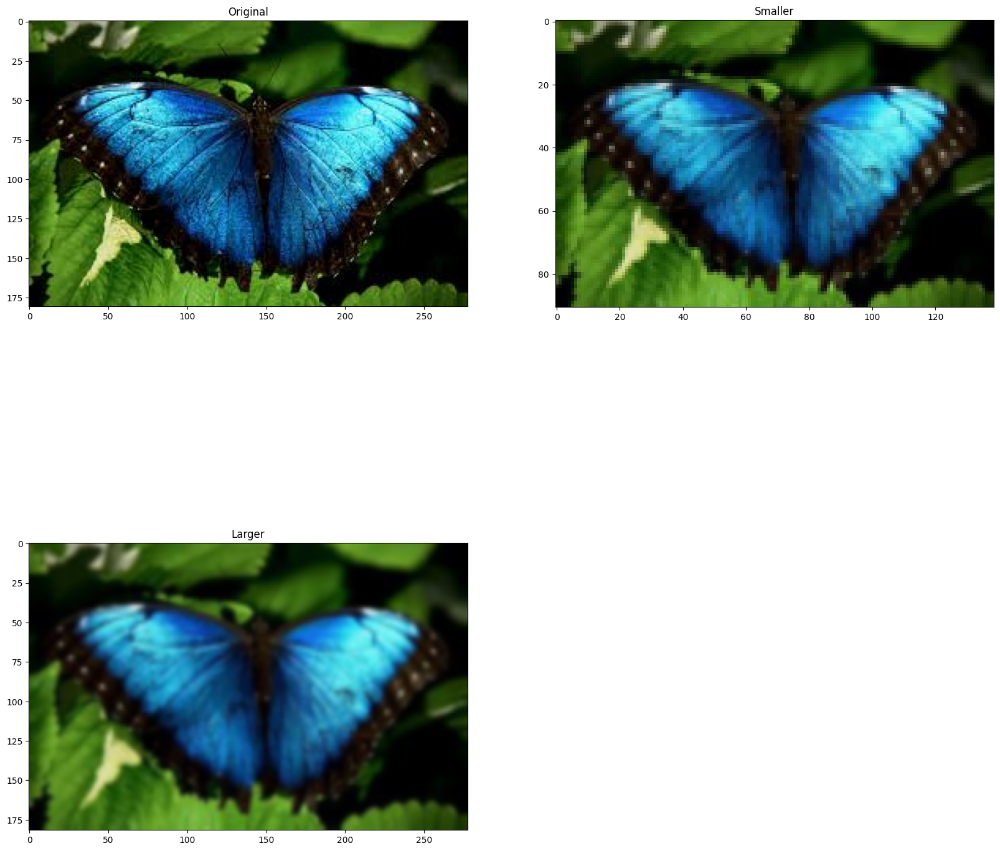

In [13]:
image = cv2.imread('butterfly.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)
plt.subplot(2, 2, 2)
plt.title("Smaller")
plt.imshow(smaller)
plt.subplot(2, 2, 3)
plt.title("Larger")
plt.imshow(larger)

# Cropping

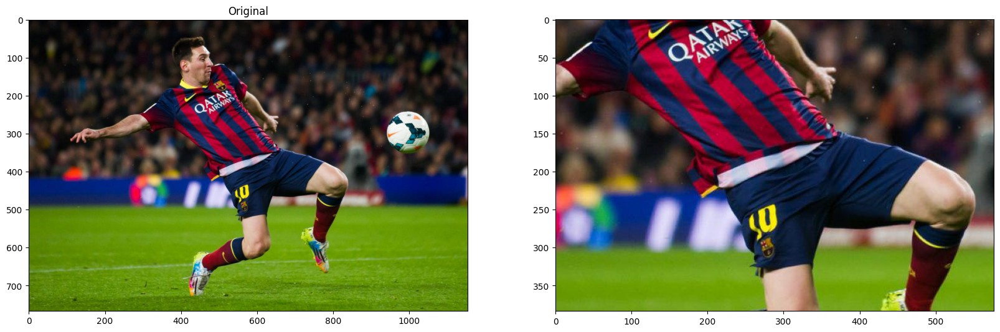

In [18]:
image = cv2.imread('messi.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
hgt, wdt = image.shape[:2]
start_row, start_col = int(hgt * .25), int(wdt * .25)
end_row, end_col = int(hgt * .75), int(wdt * .75)
cropped = image[start_row:end_row , start_col:end_col]
plt.subplot(2, 2, 2)
plt.imshow(cropped)

# Scaling, Interpolations, And Re-Sizing

In [19]:
image = cv2.imread('fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)
plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)
img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)
plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)

error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


# Thresholding, Adaptive Thresholding, And Binarization

In [ ]:
# Load our new image
image = cv2.imread('Origin_of_Species.jpg', 0)
plt.figure(figsize=(30, 30))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)
ret,thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
plt.subplot(3, 2, 2)
plt.title("Threshold Binary")
plt.imshow(thresh1)
image = cv2.GaussianBlur(image, (3, 3), 0)
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5) 
plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding")
plt.imshow(thresh)
_, th2 = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding")
plt.imshow(th2)
plt.subplot(3, 2, 5)
blur = cv2.GaussianBlur(image, (5,5), 0)
_, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.title("Guassian Otsu's Thresholding")
plt.imshow(th3)
plt.show()

# Sharpening

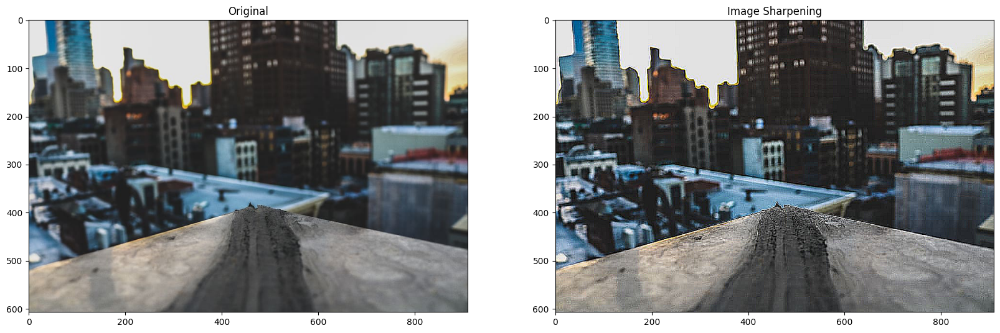

In [21]:
image = cv2.imread('building.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1,9,-1], 
                              [-1,-1,-1]])
sharpened = cv2.filter2D(image, -1, kernel_sharpening)
plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)
plt.show()

# Blurring

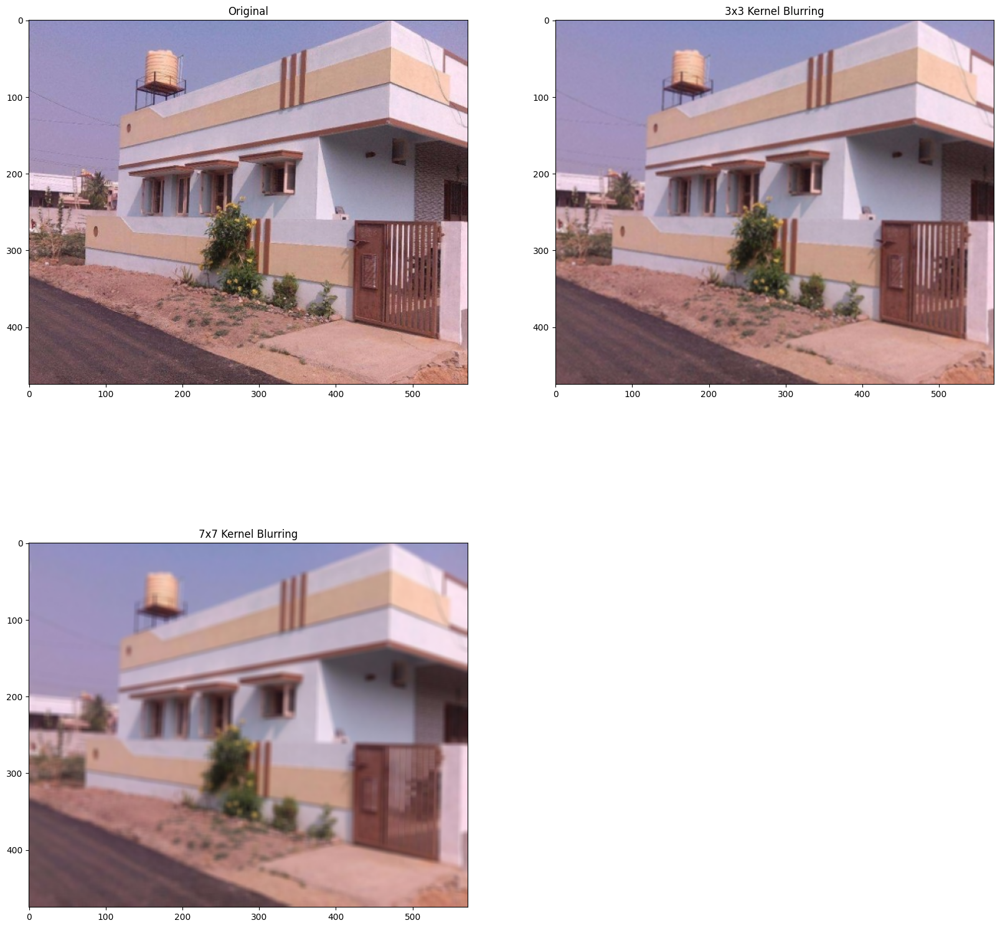

In [22]:
image = cv2.imread('home.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
kernel_3x3 = np.ones((3, 3), np.float32) / 9
blurred = cv2.filter2D(image, -1, kernel_3x3)
plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)
kernel_7x7 = np.ones((7, 7), np.float32) / 49
blurred2 = cv2.filter2D(image, -1, kernel_7x7)
plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)

# Contours

Count of Contours  = 7


NameError: name 'contours' is not defined

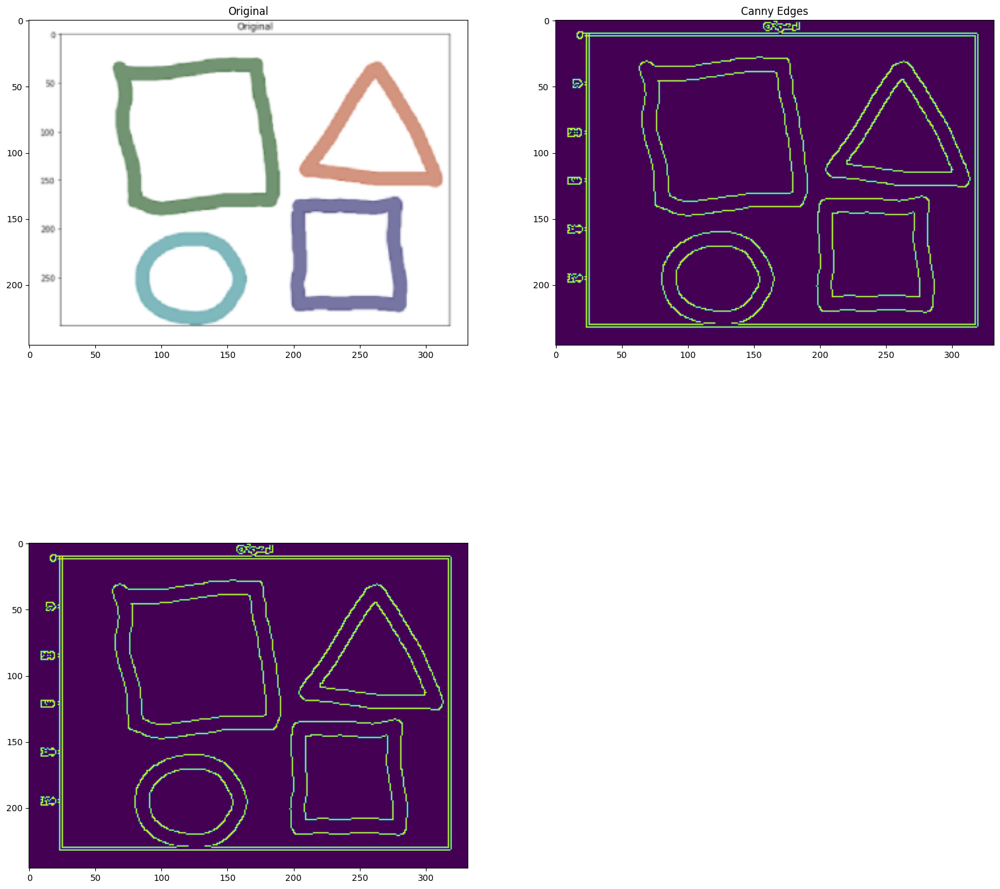

In [23]:
# Load the data
image = cv2.imread('pic.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
# Grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
# Canny edges
edged = cv2.Canny(gray, 30, 200)
plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)
# Finding Contours
contour, hier = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
plt.subplot(2, 2, 3)
plt.imshow(edged)
print("Count of Contours  = " + str(len(contour)))
# All contours
cv2.drawContours(image, contours, -1, (0,255,0), 3)
plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image)

# Line Detection Using Hough Lines

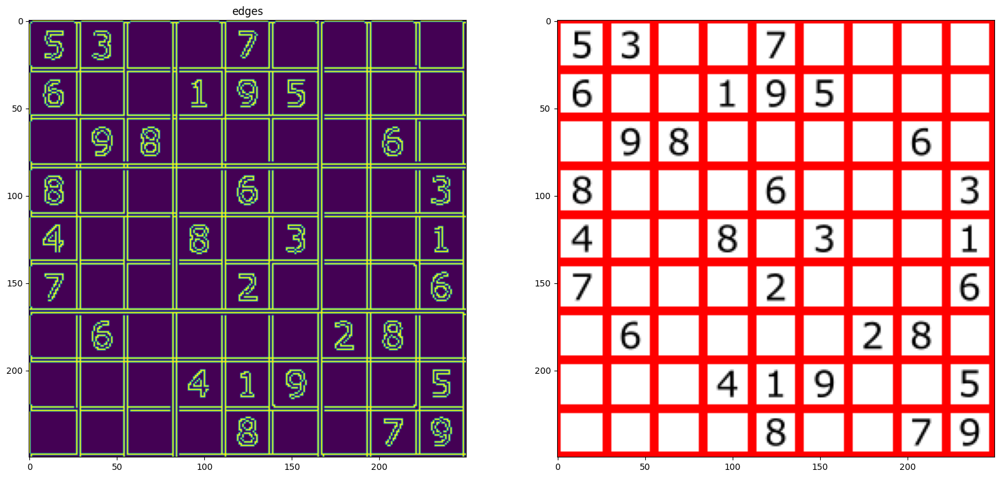

In [24]:
# Load the image
image = cv2.imread('sudoku.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
# Grayscale 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Canny Edges
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)
plt.subplot(2, 2, 1)
plt.title("edges")
plt.imshow(edges)
# Run HoughLines Fucntion 
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)
# Run for loop through each line
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x_1 = int(x0 + 1000 * (-b))
    y_1 = int(y0 + 1000 * (a))
    x_2 = int(x0 - 1000 * (-b))
    y_2 = int(y0 - 1000 * (a))
    cv2.line(image, (x_1, y_1), (x_2, y_2), (255, 0, 0), 2)
# Show Final output
plt.subplot(2, 2, 2)
plt.imshow(image)

# Finding Corners

In [25]:
# Load image 
image = cv2.imread('chessboard.png')
# Grayscaling
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# CornerHarris function  want input to be float
gray = np.float32(gray)
h_corners = cv2.cornerHarris(gray, 3, 3, 0.05)
kernel = np.ones((7,7),np.uint8)
h_corners = cv2.dilate(harris_corners, kernel, iterations = 10)
image[h_corners > 0.024 * h_corners.max() ] = [256, 128, 128]
plt.subplot(1, 1, 1)
# Final Output
plt.imshow(image)

NameError: name 'harris_corners' is not defined

<Figure size 1000x1000 with 0 Axes>

# Counting Circles And Ellipses

In [26]:
# Load image
image = cv2.imread('blobs.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
detector = cv2.SimpleBlobDetector_create()
# Detect blobs
points = detector.detect(image)

blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, points, blank, (0,0,255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
number_of_blobs = len(keypoints)
text = "Total Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (100, 0, 255), 2)

plt.subplot(2, 2, 1)

plt.imshow(blobs)
# Filtering parameters
# Initialize parameter settiing using cv2.SimpleBlobDetector
params = cv2.SimpleBlobDetector_Params()
# Area filtering parameters
params.filterByArea = True
params.minArea = 100
# Circularity filtering parameters
params.filterByCircularity = True 
params.minCircularity = 0.9
# Convexity filtering parameters
params.filterByConvexity = False
params.minConvexity = 0.2
#  inertia filtering parameters
params.filterByInertia = True
params.minInertiaRatio = 0.01
# detector with the parameters
detector = cv2.SimpleBlobDetector_create(params)
# Detect blobs
keypoints = detector.detect(image)
# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
number_of_blobs = len(keypoints)
text = "No.  Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)
# Show blobs
plt.subplot(2, 2, 2)
plt.title("Filtering Circular Blobs Only")
plt.imshow(blobs)

NameError: name 'keypoints' is not defined

<Figure size 2000x2000 with 0 Axes>